In [1]:
library(Seurat)
library(ggpubr)
library(ggsignif)
library(ggplot2)
obj.integrated=readRDS(file = "../05.2-subtype/scRNA_annodata.KC.rds")
#obj.integrated=subset(obj.integrated,idents = c('SC','BC','SC_BC'))
Idents(obj.integrated) <- "celltype2" #######也就是合并的celltype
obj.integrated=subset(obj.integrated,idents = c('GC_SC','SC','SC_BC','BC'))
obj.integrated2=subset(obj.integrated,idents = c('BC'))
obj.integrated$celltype.g <- paste(Idents(obj.integrated), obj.integrated$group, sep = "_")
Idents(obj.integrated) <- "celltype.g"
table(Idents(obj.integrated))

The legacy packages maptools, rgdal, and rgeos, underpinning this package
will retire shortly. Please refer to R-spatial evolution reports on
https://r-spatial.org/r/2023/05/15/evolution4.html for details.
This package is now running under evolution status 0 

Attaching SeuratObject

Loading required package: ggplot2




    SC_young     BC_young  GC_SC_young  SC_BC_young GC_SC_middle    SC_middle 
        3196         2587          386         1436          320         2373 
   BC_middle SC_BC_middle      SC_aged      BC_aged   SC_BC_aged   GC_SC_aged 
        2803         1312         5276         3928         2457          859 

In [2]:
gene=readRDS('bm.pathway.rds')
head(gene,2)
names(gene)

$`basement membrane`
  [1] "ACHE"     "ACAN"     "ANG"      "ANXA2"    "ANXA2P2"  "APLP1"   
  [7] "DST"      "ENTPD2"   "CD151"    "COL2A1"   "COL4A1"   "COL4A2"  
 [13] "COL4A3"   "COL4A4"   "COL4A5"   "COL4A6"   "COL5A1"   "COL7A1"  
 [19] "COL8A1"   "COL8A2"   "COL9A1"   "COL9A3"   "COL15A1"  "COL17A1" 
 [25] "CST3"     "DAG1"     "DLG1"     "EFNA5"    "MEGF9"    "FBLN1"   
 [31] "FBN1"     "FGF9"     "FN1"      "HSPG2"    "TNC"      "ITGA6"   
 [37] "LAD1"     "LAMA2"    "LAMA3"    "LAMA4"    "LAMA5"    "LAMB1"   
 [43] "LAMB2"    "LAMB3"    "LAMC1"    "LAMC2"    "LOXL1"    "LOXL2"   
 [49] "MATN2"    "NID1"     "NTN3"     "SERPINF1" "PTN"      "SPARC"   
 [55] "TGFBI"    "THBS2"    "THBS4"    "TIMP1"    "TIMP3"    "USH2A"   
 [61] "VTN"      "COLQ"     "ATRN"     "CASK"     "TMEFF1"   "NTN1"    
 [67] "ADAMTS1"  "LAMC3"    "NID2"     "LAMB4"    "NTNG1"    "TMEFF2"  
 [73] "EGFL6"    "ATRNL1"   "TINAG"    "EFEMP2"   "P3H2"     "ERBIN"   
 [79] "NTN4"     "SMOC1"    "SMOC2"    "VWA1"     "MMRN2"    "FRAS1"   
 [85] "COL18A1"  "HMCN1"    "NTNG2"    "NTN5"     "OTOL1"    "EGFLAM"  
 [91] "CCDC80"   "FREM1"    "FREM3"    "NPNT"     "HMCN2"    "LAMA1"   
 [97] "RELL2"    "COL28A1"  "VWA2"     "FREM2"    "VWC2"     "AGRN"    
[103] "AMTN"    

$`basement membrane disassembly`
[1] "CMA1" "CTSS" "HPN"

[1] "basement membrane"                           
[2] "basement membrane disassembly"               
[3] "basement membrane organization"              
[4] "basement membrane assembly"                  
[5] "basement membrane collagen trimer"           
[6] "regulation of basement membrane organization"

In [3]:
nfkb=c('IL1A','TNF','IL1R1','TNFRSF1A','TNFRSF1B','IKBKG','IKBKG','RELA','IKBKG','NFKB1','MYD88','MYD88','MYD88','MYD88','IKBKB',
       'IKBKB','RELA','RELA','TNFAIP3','TNFAIP3','CHUK','IKBKB','MYD88','MAP3K7','IKBKG','TRADD','RIPK1','FADD','MAP3K14','NFKB1',
       'TRAF6','MAP3K1','TAB1','TNFAIP3','NFKBIA','RELA','MAP3K7','MAP3K7','MAP3K7','TRAF6','TAB1')

In [4]:
obj.integrated=AddModuleScore(obj.integrated,features = list(gene[[1]]),name=names(gene)[1])
obj.integrated=AddModuleScore(obj.integrated,features = list(gene[[2]]),name=names(gene)[2])
obj.integrated=AddModuleScore(obj.integrated,features = list(gene[[3]]),name=names(gene)[3])
obj.integrated=AddModuleScore(obj.integrated,features = list(gene[[4]]),name=names(gene)[4])
obj.integrated=AddModuleScore(obj.integrated,features = list(gene[[5]]),name=names(gene)[5])
obj.integrated=AddModuleScore(obj.integrated,features = list(gene[[6]]),name=names(gene)[6])
obj.integrated=AddModuleScore(obj.integrated,features = list(nfkb),name='nfkb')
head(obj.integrated,2)

Warning message:
“The following features are not present in the object: ANXA2P2, NTN3, USH2A, TMEFF1, TINAG, P3H2, ERBIN, NTNG2, OTOL1, FREM3, LAMA1, not searching for symbol synonyms”
Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is basement.membrane1; see ?make.names for more details on syntax validity”
Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is basement.membrane.disassembly1; see ?make.names for more details on syntax validity”
Warning message:
“The following features are not present in the object: NTNG2, not searching for symbol synonyms”
Warning message:
“Invalid name supplied, making object name syntactically valid. New object name is basement.membrane.organization1; see ?make.names for more details on syntax validity”
Warning message:
“The following features are not present in the object: NTNG2, not searching for symbol synonyms”
Warning message:
“Invalid name supplied, ma

,orig.ident,nCount_RNA,nFeature_RNA,sample,group,group2,percent.mito,integrated_snn_res.1.8,seurat_clusters,integrated_snn_res.1.6,⋯,SC1,BC1,celltype.g,basement.membrane1,basement.membrane.disassembly1,basement.membrane.organization1,basement.membrane.assembly1,basement.membrane.collagen.trimer1,regulation.of.basement.membrane.organization1,nfkb1
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<dbl>,<chr>,<fct>,<chr>,⋯,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Skin-Y-18_AAACCTGCACAGTCGC-18,Skin-Y-18,10128,3125,Skin-Y-18,young,18,0.07099131,0,2,2,⋯,2.192695,-0.4098248,SC_young,-0.03455841,-0.028816798,-0.1380910,-0.03958198,-0.01589016,0.05318944,-0.13721560
Skin-Y-18_AAACCTGGTCTCAACA-18,Skin-Y-18,4145,1426,Skin-Y-18,young,18,0.14282268,9,4,14,⋯,1.622463,0.6968192,SC_young,-0.05654325,-0.009965443,-0.1160495,-0.04794820,-0.01557398,-0.04592599,-0.03683826


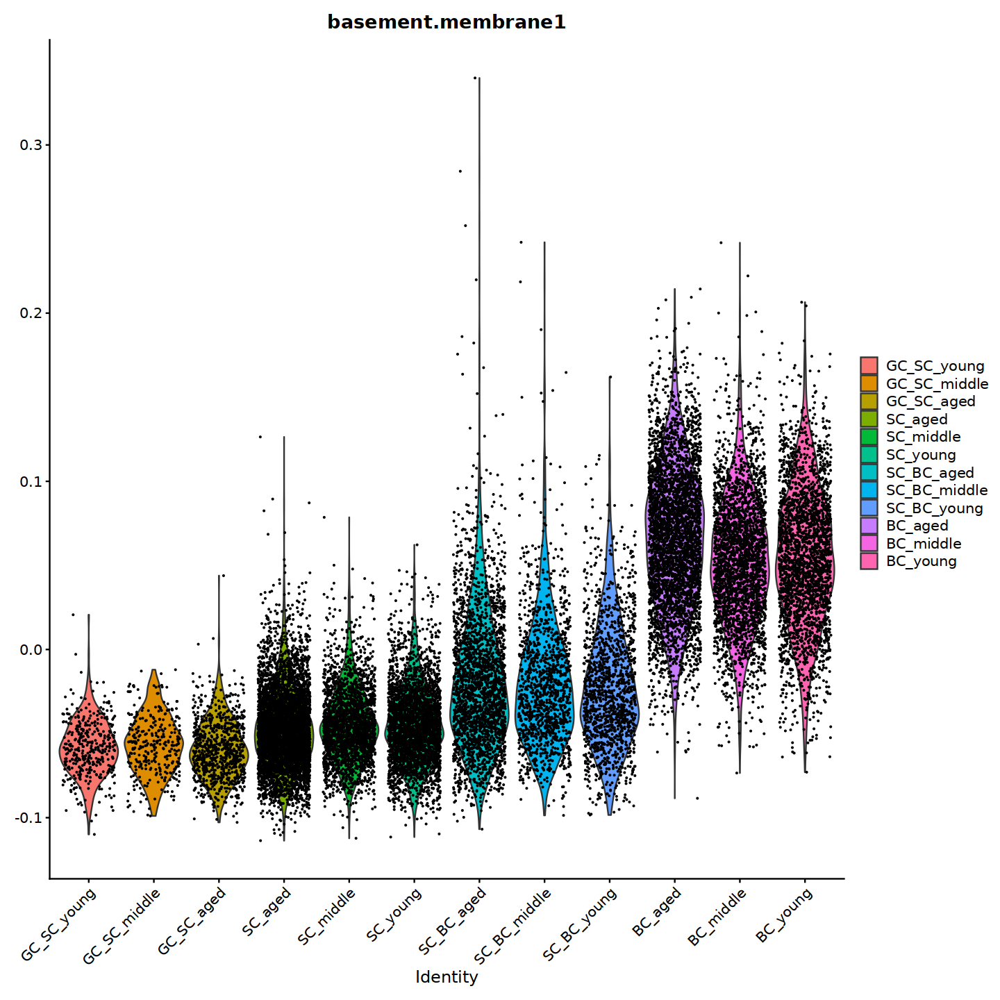

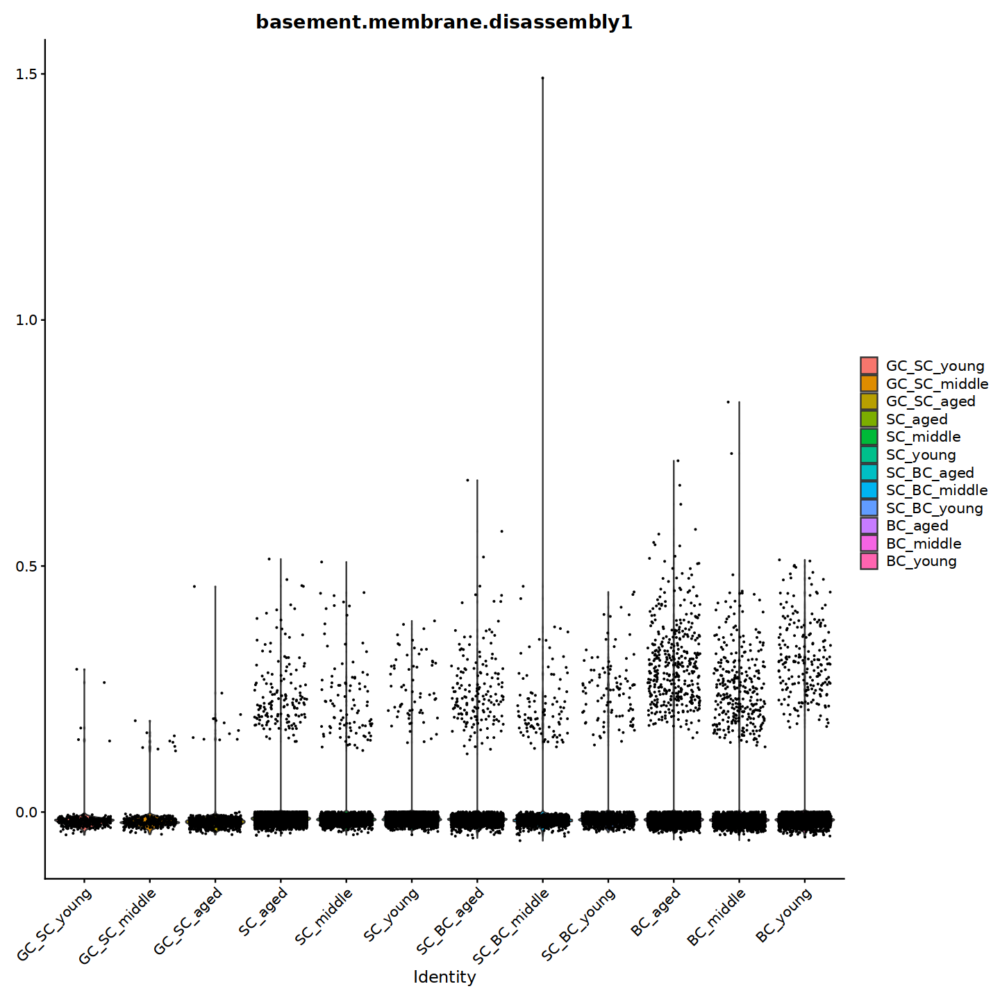

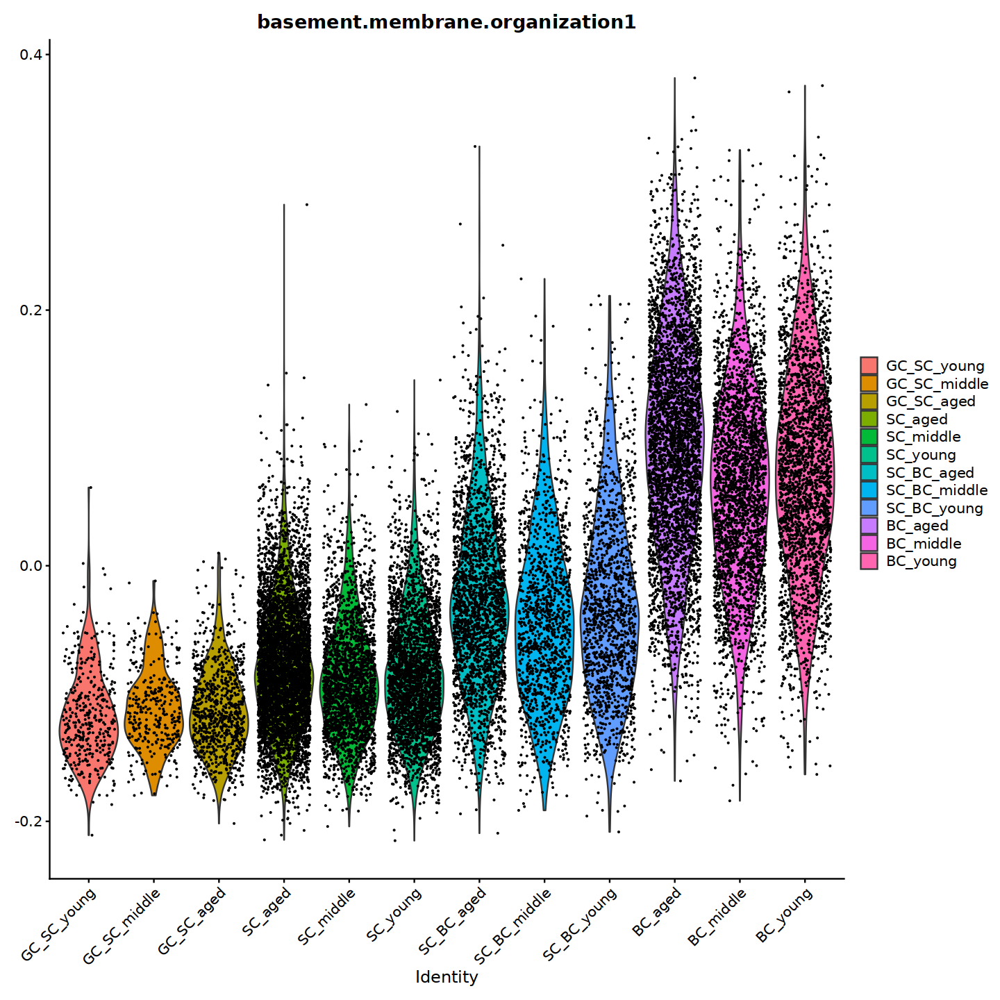

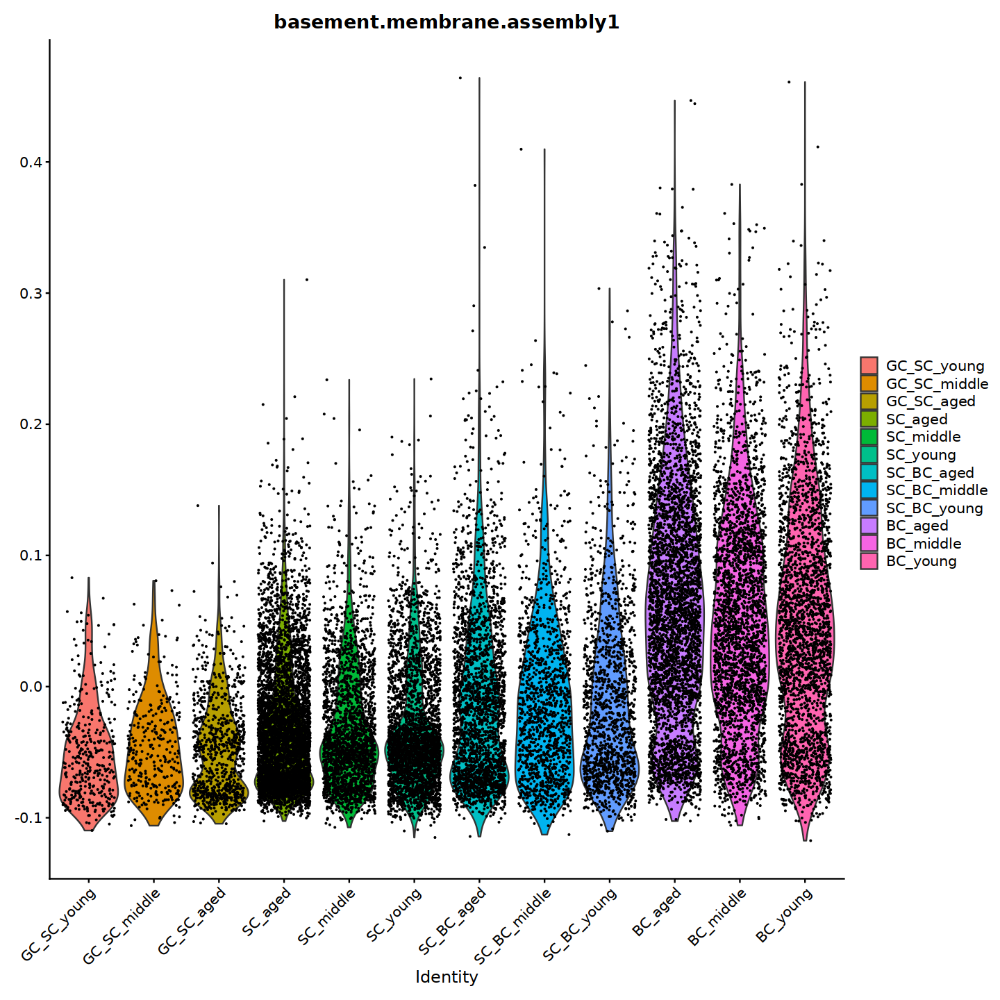

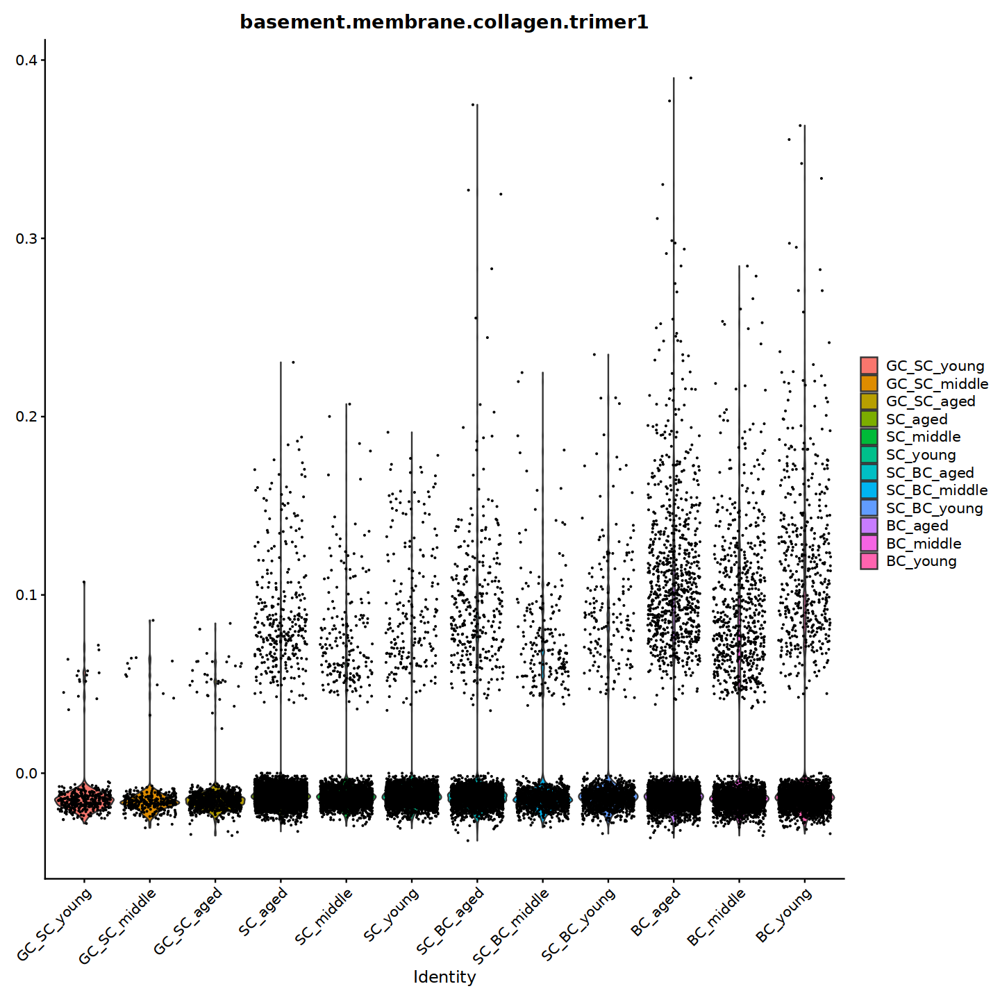

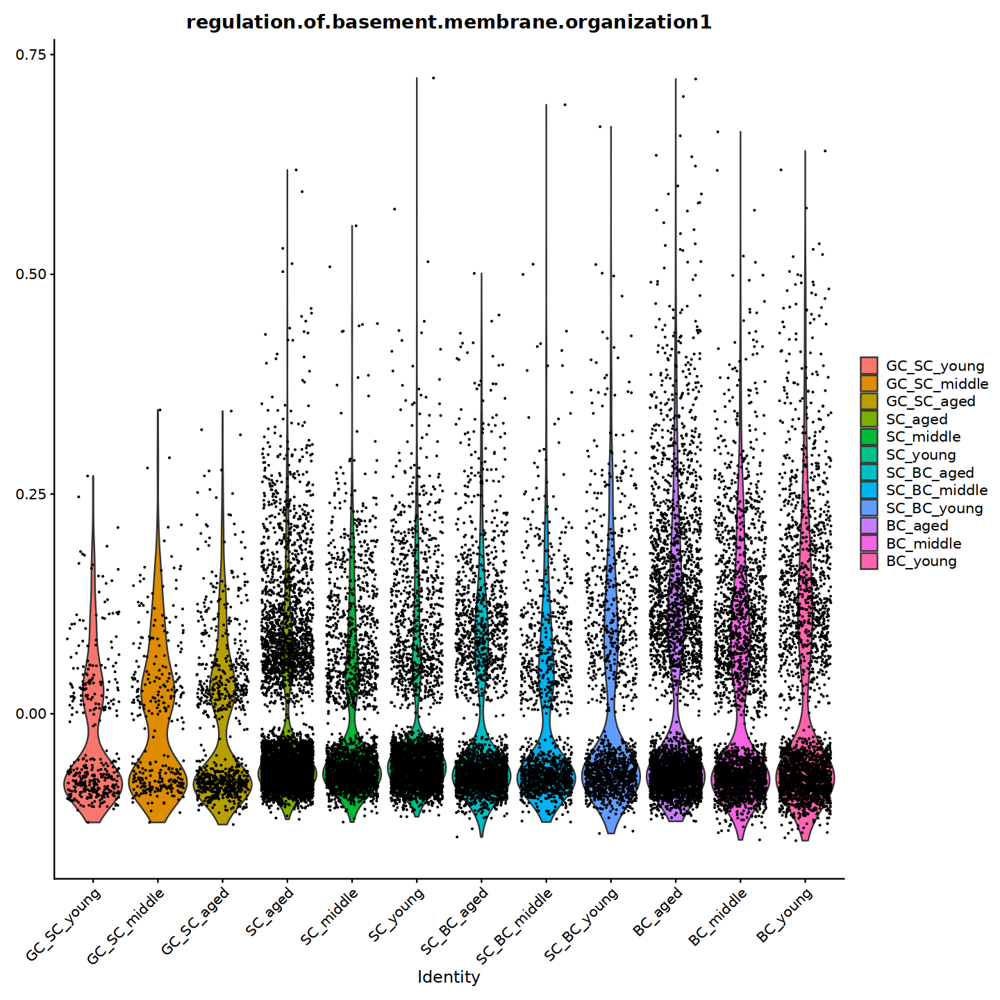

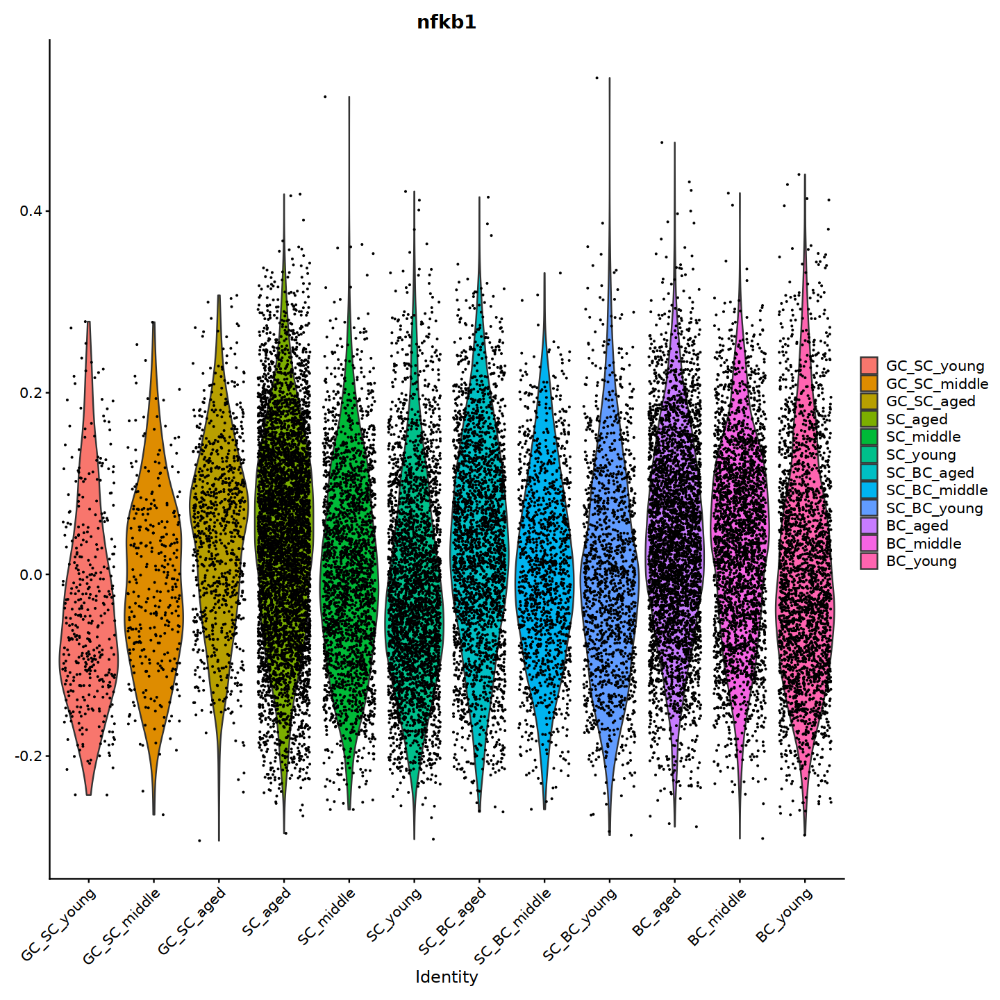

In [5]:
options(repr.plot.width=12, repr.plot.height=12)
Idents(obj.integrated)=obj.integrated$celltype.g
DefaultAssay(obj.integrated)='RNA'
levels(obj.integrated)=c('GC_SC_young','GC_SC_middle','GC_SC_aged','SC_aged','SC_middle','SC_young','SC_BC_aged',
                         'SC_BC_middle','SC_BC_young','BC_aged','BC_middle','BC_young')
VlnPlot(obj.integrated,features = 'basement.membrane1')
VlnPlot(obj.integrated,features = 'basement.membrane.disassembly1')
VlnPlot(obj.integrated,features = 'basement.membrane.organization1')
VlnPlot(obj.integrated,features = 'basement.membrane.assembly1')
VlnPlot(obj.integrated,features = 'basement.membrane.collagen.trimer1')
VlnPlot(obj.integrated,features = 'regulation.of.basement.membrane.organization1')
VlnPlot(obj.integrated,features = 'nfkb1')

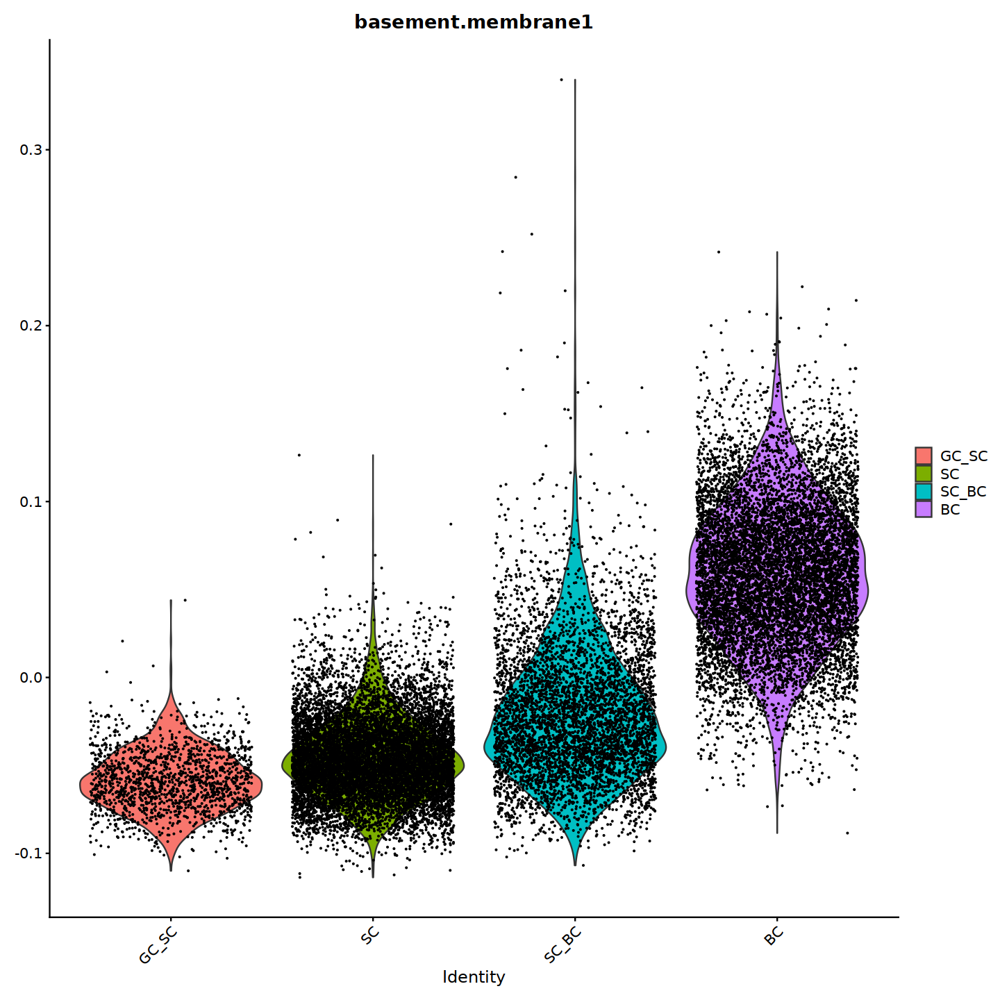

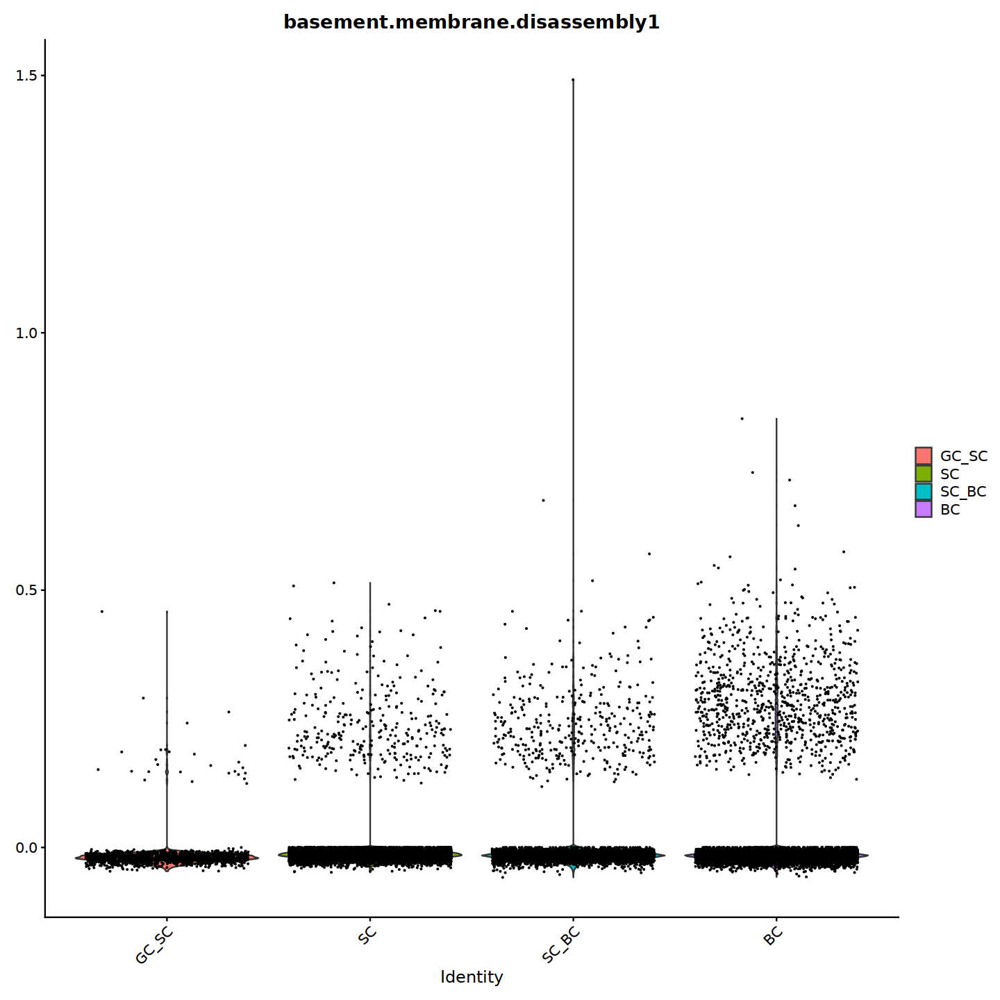

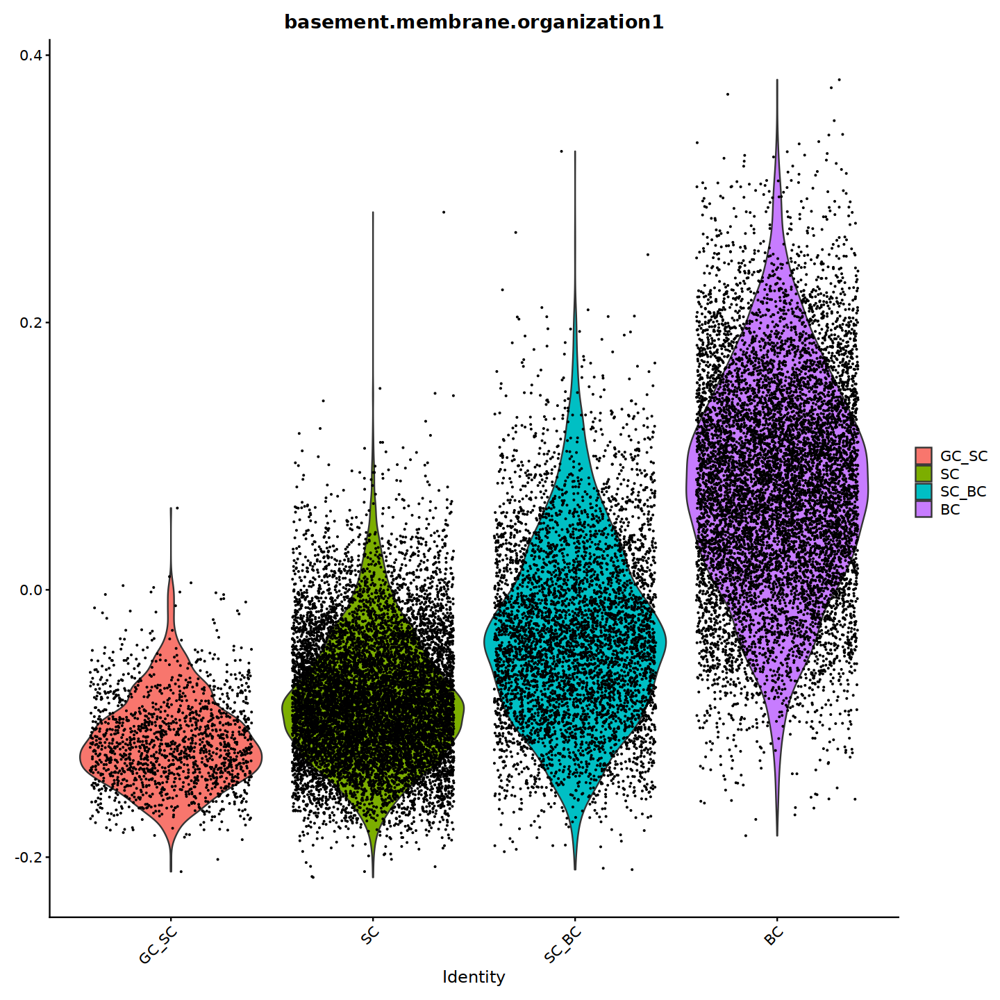

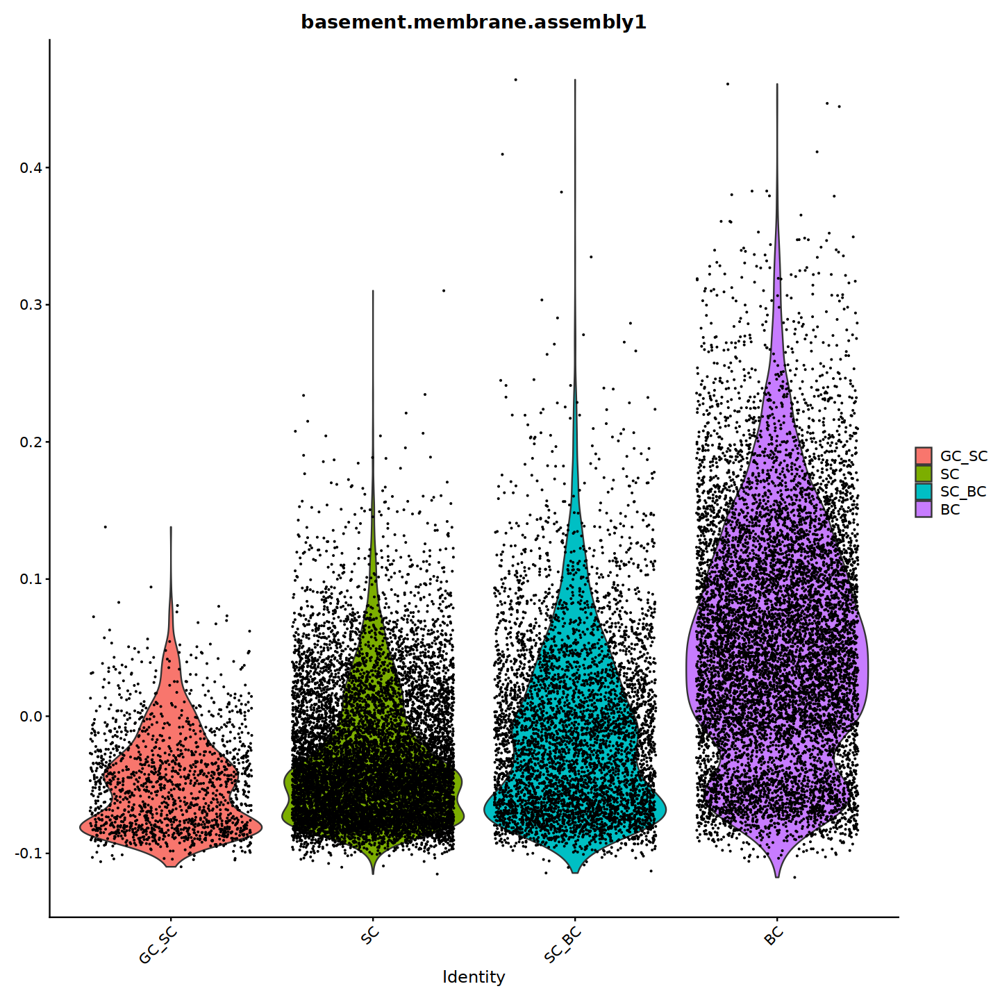

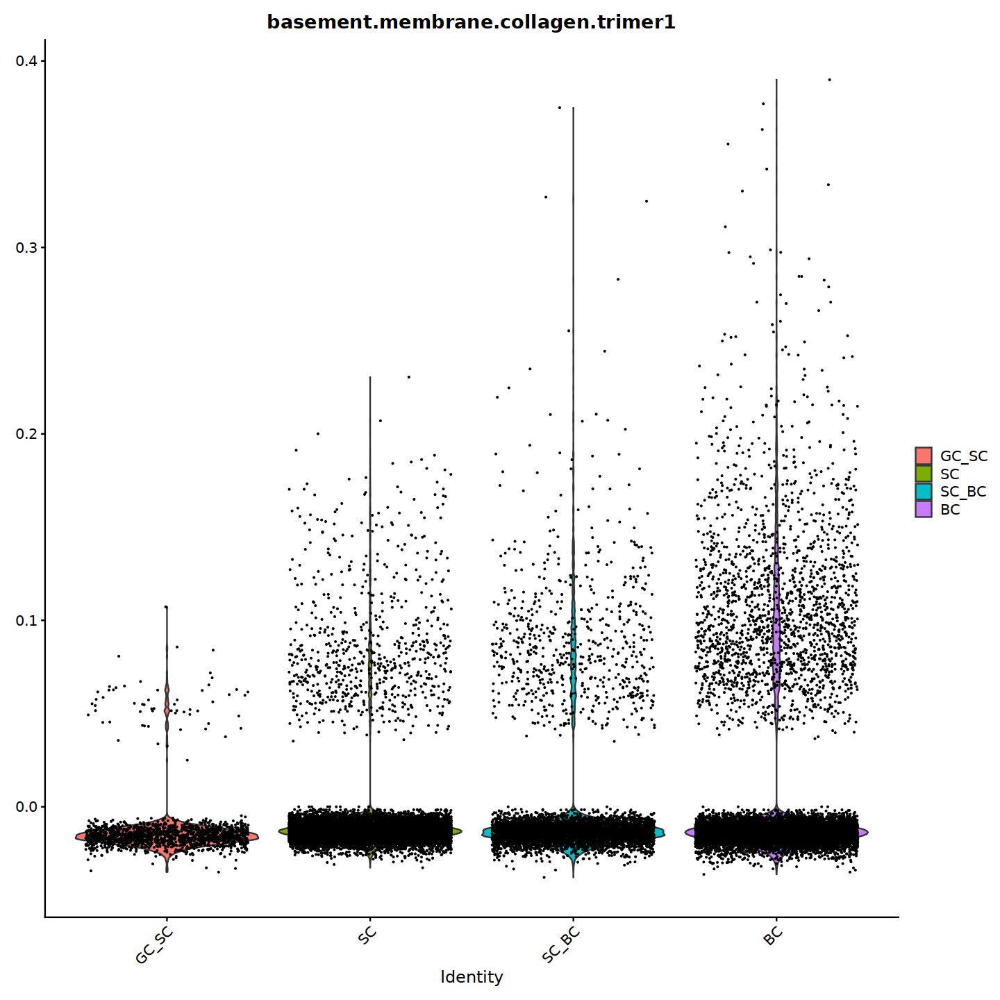

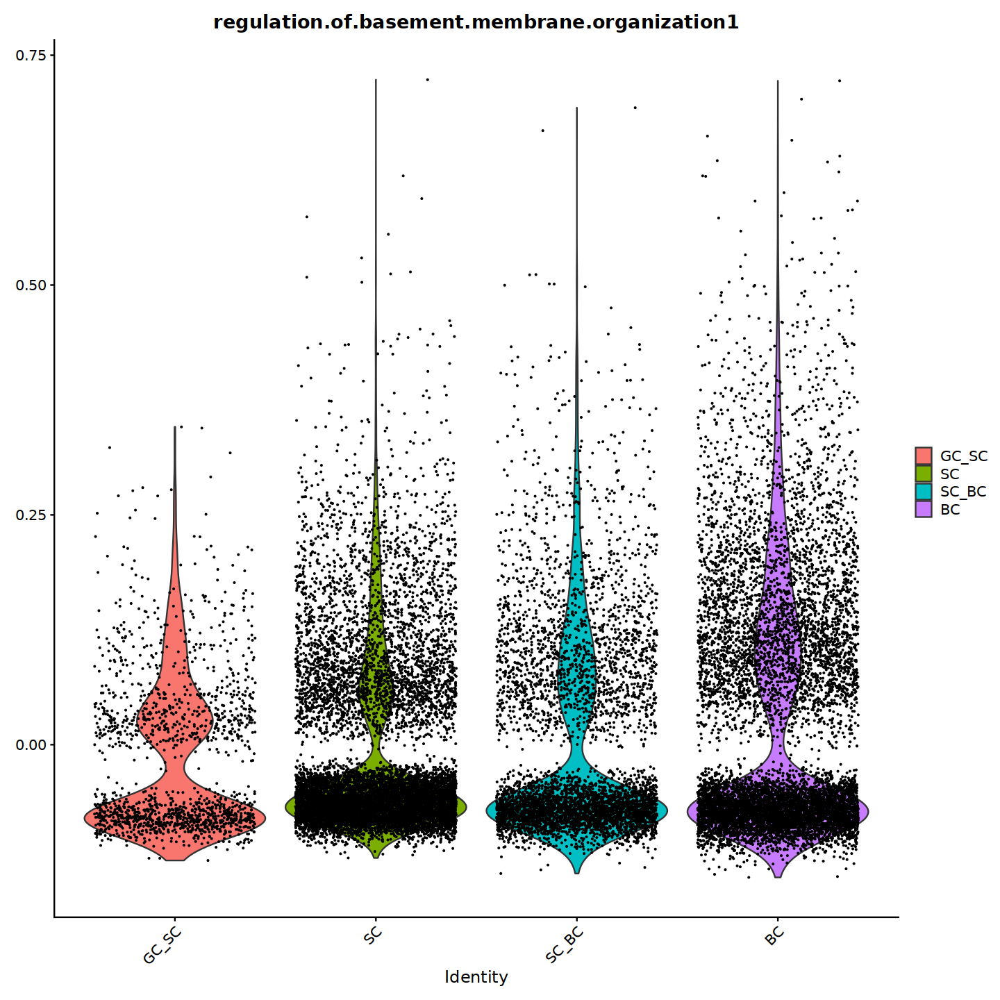

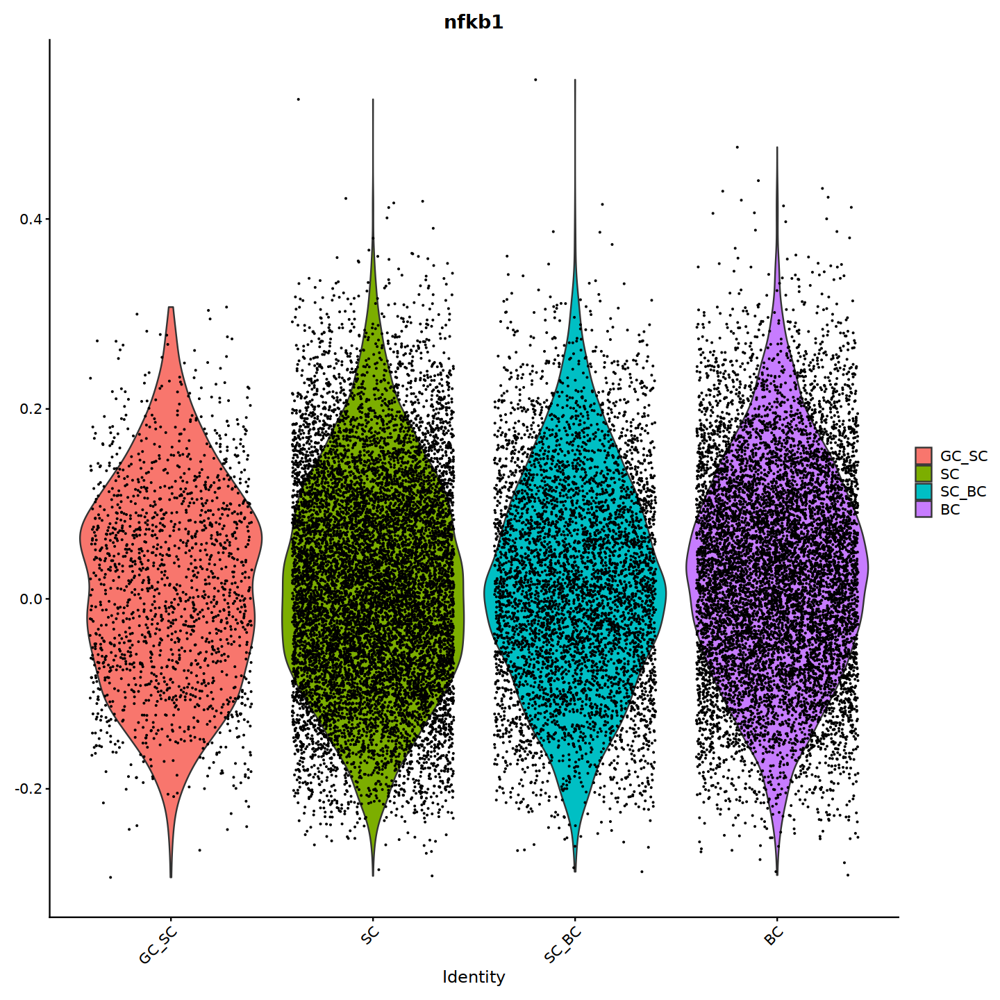

In [6]:
options(repr.plot.width=12, repr.plot.height=12)
Idents(obj.integrated)=obj.integrated$celltype2
DefaultAssay(obj.integrated)='RNA'
levels(obj.integrated)=c('GC_SC','SC','SC_BC','BC')
VlnPlot(obj.integrated,features = 'basement.membrane1')
VlnPlot(obj.integrated,features = 'basement.membrane.disassembly1')
VlnPlot(obj.integrated,features = 'basement.membrane.organization1')
VlnPlot(obj.integrated,features = 'basement.membrane.assembly1')
VlnPlot(obj.integrated,features = 'basement.membrane.collagen.trimer1')
VlnPlot(obj.integrated,features = 'regulation.of.basement.membrane.organization1')
VlnPlot(obj.integrated,features = 'nfkb1')

# 提取重做

In [7]:
head(obj.integrated,2)
gene1=c('basement.membrane1','basement.membrane.organization1','basement.membrane.assembly1',
        'regulation.of.basement.membrane.organization1','nfkb1','EXTRACELLULAR_MATRIX_STRUCTURAL_CONSTITUENT_CONFERRING_COMPRESSION_RESISTANCE1',
       'EXTRACELLULAR_MATRIX_CONSTITUENT_CONFERRING_ELASTICITY1','EXTRACELLULAR_MATRIX_STRUCTURAL_CONSTITUENT_CONFERRING_TENSILE_STRENGTH1')
exprs <- data.frame(FetchData(object = obj.integrated, vars = c(gene1,'celltype2','celltype.g')))

,orig.ident,nCount_RNA,nFeature_RNA,sample,group,group2,percent.mito,integrated_snn_res.1.8,seurat_clusters,integrated_snn_res.1.6,⋯,SC1,BC1,celltype.g,basement.membrane1,basement.membrane.disassembly1,basement.membrane.organization1,basement.membrane.assembly1,basement.membrane.collagen.trimer1,regulation.of.basement.membrane.organization1,nfkb1
,<chr>,<dbl>,<int>,<chr>,<chr>,<chr>,<dbl>,<chr>,<fct>,<chr>,⋯,<dbl>,<dbl>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Skin-Y-18_AAACCTGCACAGTCGC-18,Skin-Y-18,10128,3125,Skin-Y-18,young,18,0.07099131,0,2,2,⋯,2.192695,-0.4098248,SC_young,-0.03455841,-0.028816798,-0.1380910,-0.03958198,-0.01589016,0.05318944,-0.13721560
Skin-Y-18_AAACCTGGTCTCAACA-18,Skin-Y-18,4145,1426,Skin-Y-18,young,18,0.14282268,9,4,14,⋯,1.622463,0.6968192,SC_young,-0.05654325,-0.009965443,-0.1160495,-0.04794820,-0.01557398,-0.04592599,-0.03683826


Warning message in FetchData.Seurat(object = obj.integrated, vars = c(gene1, "celltype2", :
“The following requested variables were not found: EXTRACELLULAR_MATRIX_STRUCTURAL_CONSTITUENT_CONFERRING_COMPRESSION_RESISTANCE1, EXTRACELLULAR_MATRIX_CONSTITUENT_CONFERRING_ELASTICITY1, EXTRACELLULAR_MATRIX_STRUCTURAL_CONSTITUENT_CONFERRING_TENSILE_STRENGTH1”


In [18]:
saveRDS(obj.integrated,'scRNA_annodata.KC.BMscore.rds')

In [17]:
noise <- rnorm(n = length(x = exprs[,gene1])) / 100000
exprs[,gene1] <- exprs[, gene1] + noise
#exprs$celltype.g=factor(exprs$celltype.g,levels = c('SC_aged','SC_middle','SC_young','SC_BC_aged','SC_BC_middle','SC_BC_young','BC_aged','BC_middle','BC_young'))
exprs$celltype.g=factor(exprs$celltype.g,levels = c('GC_SC_young','GC_SC_middle','GC_SC_aged','SC_young','SC_middle','SC_aged',
                                                    'SC_BC_young','SC_BC_middle','SC_BC_aged',
                                                  'BC_young','BC_middle','BC_aged'))
#gene1=c('basement.membrane1','basement.membrane.disassembly1','basement.membrane.organization1','basement.membrane.assembly1',
#       'basement.membrane.collagen.trimer1','regulation.of.basement.membrane.organization1')
if(!dir.exists('aging')){
    dir.create('aging')
}
for(i in gene1){
    #compar=list(c('BC_aged','BC_middle'),c('BC_middle','BC_young'),c('BC_aged','BC_young'))
    compar=list(c('BC_aged','BC_middle'),c('BC_aged','BC_young'),c('BC_middle','BC_young'))
    tmp=exprs[,c('celltype.g',i)] ########取出这个通路score，防止ggplot里y输入是字符导致无法计算
    colnames(tmp)=c('celltype.g','pathway')
    plot=ggplot(data = tmp,mapping = aes(x = celltype.g,y = pathway)) +
    geom_violin(scale = "width",adjust =1,trim = TRUE,mapping = aes(fill = celltype.g)) +
    geom_boxplot(width=.2,col="black",fill="white")+
    theme(panel.background = element_blank(),axis.title.x = element_blank(),axis.title.y = element_blank(),
       axis.text.x = element_text(size=10),axis.text.y = element_text(size=10),axis.line = element_line(colour = "black"))+ggtitle(i)+
    stat_compare_means(comparisons = compar,label = "p.signif",method = 't.test',size=10,p.adjust.methods='bonferroni') #,method = 't.test'
    ggsave(paste0('aging/',i,'.pdf'),plot,width = 10,height = 10)
    ggsave(paste0('aging/',i,'.png'),plot,width = 10,height = 10)
}


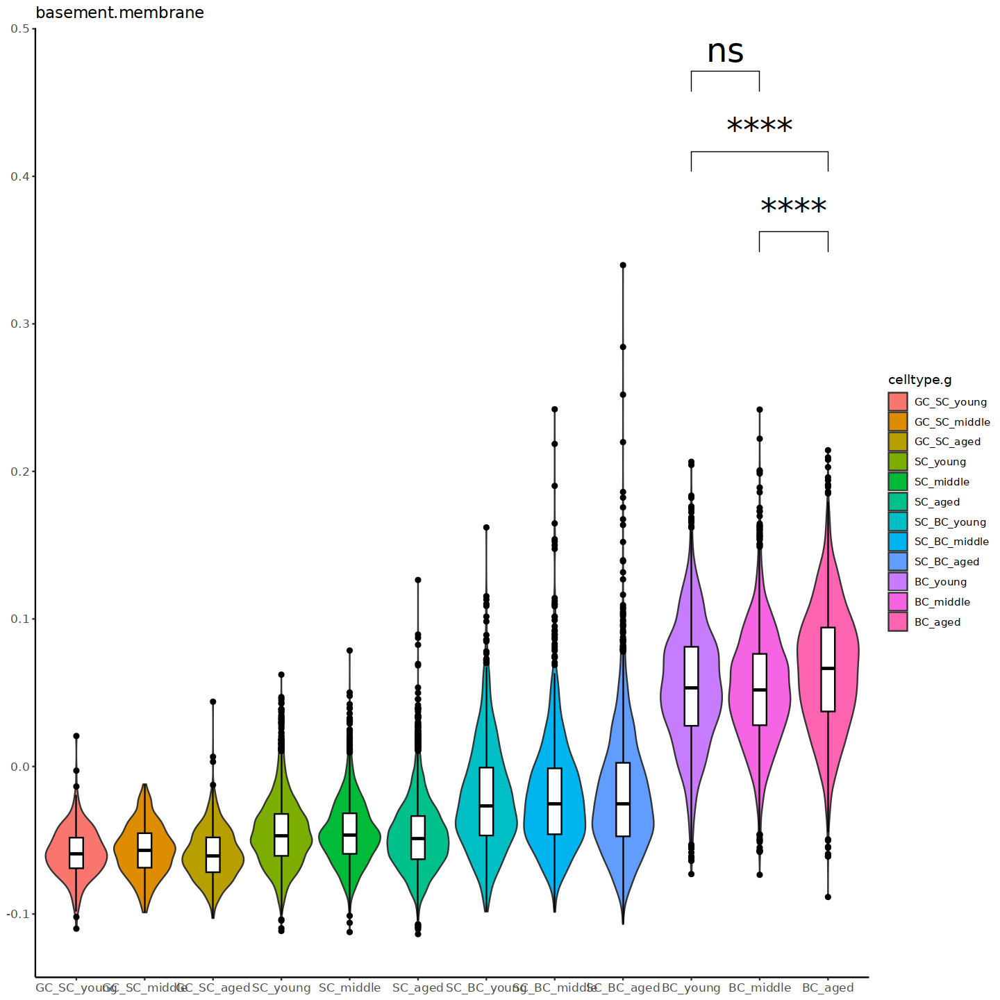

In [13]:
exprs$celltype.g=factor(exprs$celltype.g,levels = c('GC_SC_young','GC_SC_middle','GC_SC_aged','SC_young','SC_middle','SC_aged',
                                                    'SC_BC_young','SC_BC_middle','SC_BC_aged',
                                                  'BC_young','BC_middle','BC_aged'))
compar=list(c('BC_aged','BC_middle'),c('BC_aged','BC_young'),c('BC_middle','BC_young'))
    tmp=exprs[,c('celltype.g','basement.membrane1')] ########取出这个通路score，防止ggplot里y输入是字符导致无法计算
    colnames(tmp)=c('celltype.g','pathway')
    plot=ggplot(data = tmp,mapping = aes(x = celltype.g,y = pathway)) +
    geom_violin(scale = "width",adjust =1,trim = TRUE,mapping = aes(fill = celltype.g)) +
    geom_boxplot(width=.2,col="black",fill="white")+
    theme(panel.background = element_blank(),axis.title.x = element_blank(),axis.title.y = element_blank(),
       axis.text.x = element_text(size=10),axis.text.y = element_text(size=10),axis.line = element_line(colour = "black"))+ggtitle('basement.membrane')+
    stat_compare_means(comparisons = compar,label = "p.signif",method = 't.test',size=10,p.adjust.methods='bonferroni') 
plot